## 气球数据集转换成coco格式

In [5]:
# Download the data and unzip it
!python tools/misc/download_dataset.py --dataset-name balloon --save-dir data --unzip

 58%|██████████████████████▏               | 21.6M/36.9M [00:39<00:15, 1.02MB/s]^C
Traceback (most recent call last):
  File "tools/misc/download_dataset.py", line 201, in <module>
    main()
  File "tools/misc/download_dataset.py", line 192, in main
    download(
  File "tools/misc/download_dataset.py", line 61, in download
    pool.join()
  File "/home/dongkaixing/anaconda3/envs/openmmlab_camb_test/lib/python3.8/multiprocessing/pool.py", line 662, in join
    self._worker_handler.join()
  File "/home/dongkaixing/anaconda3/envs/openmmlab_camb_test/lib/python3.8/threading.py", line 1011, in join
    self._wait_for_tstate_lock()
  File "/home/dongkaixing/anaconda3/envs/openmmlab_camb_test/lib/python3.8/threading.py", line 1027, in _wait_for_tstate_lock
    elif lock.acquire(block, timeout):
KeyboardInterrupt


In [18]:
import os.path as osp
import mmcv
from mmengine.fileio import dump, load
from mmengine.utils import track_iter_progress

def convert_balloon_to_coco(ann_file, out_file, image_prefix):
    data_infos = load(ann_file)

    annotations = []
    images = []
    obj_count = 0
    for idx, v in enumerate(track_iter_progress(data_infos.values())):
        filename = v['filename']
        img_path = osp.join(image_prefix, filename)
        height, width = mmcv.imread(img_path).shape[:2]

        images.append(
            dict(id=idx, file_name=filename, height=height, width=width))
        
        for _, obj in v['regions'].items():
            assert not obj['region_attributes']
            obj = obj['shape_attributes']
            px = obj['all_points_x']
            py = obj['all_points_y']
            poly = [(x + 0.5, y + 0.5) for x, y in zip(px, py)]
            poly = [p for x in poly for p in x]

            x_min, y_min, x_max, y_max = (min(px), min(py), max(px), max(py))

            data_anno = dict(
                image_id=idx,
                id=obj_count,
                category_id=0,
                bbox=[x_min, y_min, x_max - x_min, y_max - y_min],
                area=(x_max - x_min) * (y_max - y_min),
                segmentation=[poly],
                iscrowd=0)
            annotations.append(data_anno)
            obj_count += 1

    coco_format_json = dict(
        images=images,
        annotations=annotations,
        categories=[{
            'id': 0,
            'name': 'balloon'
        }])
    dump(coco_format_json, out_file)

if __name__ == '__main__':
    convert_balloon_to_coco(ann_file='data/balloon/train/via_region_data.json',
                            out_file='data/balloon/train.json',
                            image_prefix='data/balloon/train')
    convert_balloon_to_coco(ann_file='data/balloon/val/via_region_data.json',
                            out_file='data/balloon/val.json',
                            image_prefix='data/balloon/val')

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 61/61, 41.3 task/s, elapsed: 1s, ETA:     0s
[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 13/13, 39.7 task/s, elapsed: 0s, ETA:     0s


## 可视化数据集和标签

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


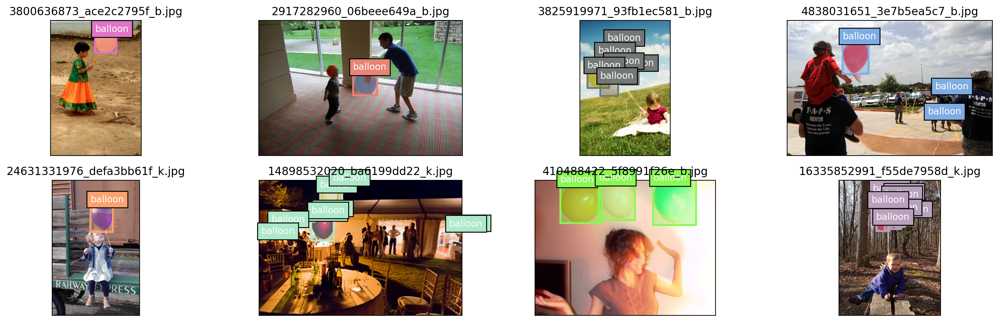

In [22]:
from pycocotools.coco import COCO
import numpy as np
import os.path as osp
from matplotlib.collections import PatchCollection
from matplotlib.patches import Polygon
import os
os.chdir('/home/dongkaixing/openMMlabCamp/MMPose_Tutorials/2023/0524/mmdetection')
def apply_exif_orientation(image):
    _EXIF_ORIENT = 274
    if not hasattr(image, 'getexif'):
        return image

    try:
        exif = image.getexif()
    except Exception:
        exif = None

    if exif is None:
        return image

    orientation = exif.get(_EXIF_ORIENT)

    method = {
        2: Image.FLIP_LEFT_RIGHT,
        3: Image.ROTATE_180,
        4: Image.FLIP_TOP_BOTTOM,
        5: Image.TRANSPOSE,
        6: Image.ROTATE_270,
        7: Image.TRANSVERSE,
        8: Image.ROTATE_90,
    }.get(orientation)
    if method is not None:
        return image.transpose(method)
    return image


def show_bbox_only(coco, anns, show_label_bbox=True, is_filling=True):
    """Show bounding box of annotations Only."""
    if len(anns) == 0:
        return

    ax = plt.gca()
    ax.set_autoscale_on(False)

    image2color = dict()
    for cat in coco.getCatIds():
        image2color[cat] = (np.random.random((1, 3)) * 0.7 + 0.3).tolist()[0]

    polygons = []
    colors = []

    for ann in anns:
        color = image2color[ann['category_id']]
        bbox_x, bbox_y, bbox_w, bbox_h = ann['bbox']
        poly = [[bbox_x, bbox_y], [bbox_x, bbox_y + bbox_h],
                [bbox_x + bbox_w, bbox_y + bbox_h], [bbox_x + bbox_w, bbox_y]]
        polygons.append(Polygon(np.array(poly).reshape((4, 2))))
        colors.append(color)

        if show_label_bbox:
            label_bbox = dict(facecolor=color)
        else:
            label_bbox = None

        ax.text(
            bbox_x,
            bbox_y,
            '%s' % (coco.loadCats(ann['category_id'])[0]['name']),
            color='white',
            bbox=label_bbox)

    if is_filling:
        p = PatchCollection(
            polygons, facecolor=colors, linewidths=0, alpha=0.4)
        ax.add_collection(p)
    p = PatchCollection(
        polygons, facecolor='none', edgecolors=colors, linewidths=2)
    ax.add_collection(p)

    
coco = COCO('data/balloon/val.json')
image_ids = coco.getImgIds()
np.random.shuffle(image_ids)

plt.figure(figsize=(16, 5))

# 只可视化 8 张图片
for i in range(8):
    image_data = coco.loadImgs(image_ids[i])[0]
    image_path = osp.join('data/balloon/val',image_data['file_name'])
    annotation_ids = coco.getAnnIds(
            imgIds=image_data['id'], catIds=[], iscrowd=0)
    annotations = coco.loadAnns(annotation_ids)
    
    ax = plt.subplot(2, 4, i+1)
    image = Image.open(image_path).convert("RGB")
    
    # 这行代码很关键，否则可能图片和标签对不上
    image=apply_exif_orientation(image)
    
    ax.imshow(image)
    
    show_bbox_only(coco, annotations)
    
    plt.title(image_data['file_name'])
    plt.xticks([])
    plt.yticks([])
        
plt.tight_layout()

## 配置调参
The second step is to prepare a config thus the dataset could be successfully loaded. Assume that we want to use RTMDet-tiny, the config to train the detector on balloon dataset is as below. Assume the config is under directory `configs/rtmdet/` and named as `rtmdet_tiny_1xb4-20e_balloon.py`, the config is as below.


In [11]:
config_balloon = """
# Inherit and overwrite part of the config based on this config
_base_ = './rtmdet_tiny_8xb32-300e_coco.py'

data_root = 'data/balloon/' # dataset root

metainfo = {
    'classes': ('balloon', ),
    'palette': [
        (220, 20, 60),
    ]
}

train_batch_size_per_gpu = 4
train_num_workers = 2

max_epochs = 20
stage2_num_epochs = 5
base_lr = 0.00008 # 4 * 0.004 / (32*8)

# load COCO pre-trained weight
load_from = './checkpoints/rtmdet_tiny_8xb32-300e_coco_20220902_112414-78e30dcc.pth'

# backbone=dict(frozen_stages=4)
model = dict(bbox_head=dict(num_classes=1))

train_dataloader = dict(
    batch_size=train_batch_size_per_gpu,
    num_workers=train_num_workers,
    dataset=dict(
        data_root=data_root,
        metainfo=metainfo,
        data_prefix=dict(img='train/'),
        ann_file='train.json'))

val_dataloader = dict(
    dataset=dict(
        data_root=data_root,
        metainfo=metainfo,
        data_prefix=dict(img='val/'),
        ann_file='val.json'))

test_dataloader = val_dataloader

val_evaluator = dict(ann_file=data_root + 'val.json')

test_evaluator = val_evaluator

# learning rate
param_scheduler = [
    dict(
        type='LinearLR',
        start_factor=1.0e-5,
        by_epoch=False,
        begin=0,
        end=10),
    dict(
        # use cosine lr from 10 to 20 epoch
        type='CosineAnnealingLR',
        eta_min=base_lr * 0.05,
        begin=max_epochs // 2,
        end=max_epochs,
        T_max=max_epochs // 2,
        by_epoch=True,
        convert_to_iter_based=True),
]

train_pipeline_stage2 = [
    dict(type='LoadImageFromFile', backend_args=None),
    dict(type='LoadAnnotations', with_bbox=True),
    dict(
        type='RandomResize',
        scale=(640, 640),
        ratio_range=(0.1, 2.0),
        keep_ratio=True),
    dict(type='RandomCrop', crop_size=(640, 640)),
    dict(type='YOLOXHSVRandomAug'),
    dict(type='RandomFlip', prob=0.5),
    dict(type='Pad', size=(640, 640), pad_val=dict(img=(114, 114, 114))),
    dict(type='PackDetInputs')
]

# optimizer
optim_wrapper = dict(
    _delete_=True,
    type='OptimWrapper',
    optimizer=dict(type='AdamW', lr=base_lr, weight_decay=0.05),
    paramwise_cfg=dict(
        norm_decay_mult=0, bias_decay_mult=0, bypass_duplicate=True))

default_hooks = dict(
    checkpoint=dict(
        interval=5,
        max_keep_ckpts=2,  # only keep latest 2 checkpoints
        save_best='auto'
    ),
    logger=dict(type='LoggerHook', interval=5))

custom_hooks = [
    dict(
        type='PipelineSwitchHook',
        switch_epoch=max_epochs - stage2_num_epochs,
        switch_pipeline=train_pipeline_stage2)
]

train_cfg = dict(type='EpochBasedTrainLoop', max_epochs=max_epochs, val_interval=10)
visualizer = dict(vis_backends=[dict(type='LocalVisBackend'),dict(type='TensorboardVisBackend')])
"""

with open('./configs/rtmdet/rtmdet_tiny_1xb4-20e_balloon.py', 'w') as f:
    f.write(config_balloon)

In [11]:
!python tools/train.py configs/rtmdet/rtmdet_tiny_1xb4-20e_balloon.py

04/17 10:28:35 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: linux
    Python: 3.9.16 (main, Dec  7 2022, 01:11:51) [GCC 9.4.0]
    CUDA available: True
    numpy_random_seed: 904036445
    GPU 0: Tesla T4
    CUDA_HOME: /usr/local/cuda
    NVCC: Cuda compilation tools, release 11.8, V11.8.89
    GCC: x86_64-linux-gnu-gcc (Ubuntu 9.4.0-1ubuntu1~20.04.1) 9.4.0
    PyTorch: 2.0.0+cu118
    PyTorch compiling details: PyTorch built with:
  - GCC 9.3
  - C++ Version: 201703
  - Intel(R) oneAPI Math Kernel Library Version 2022.2-Product Build 20220804 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v2.7.3 (Git Hash 6dbeffbae1f23cbbeae17adb7b5b13f1f37c080e)
  - OpenMP 201511 (a.k.a. OpenMP 4.5)
  - LAPACK is enabled (usually provided by MKL)
  - NNPACK is enabled
  - CPU capability usage: AVX2
  - CUDA Runtime 11.8
  - NVCC architecture flags: -gencode;arch=compute_37,code=sm_37;-gencode;arch=compute_50,c

# 训练结果

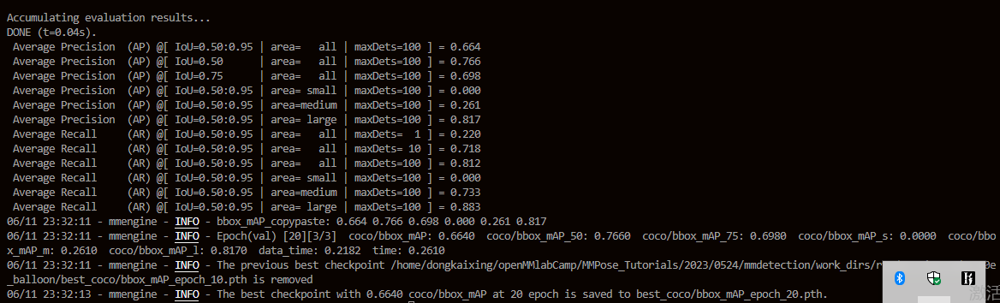


## 模型推理

After finetuning the detector, let's visualize the prediction results!

In [24]:
from mmdet.apis import DetInferencer
import glob

# Choose to use a config
config = 'configs/rtmdet/rtmdet_tiny_1xb4-20e_balloon.py'
# Setup a checkpoint file to load
checkpoint = glob.glob('./work_dirs/rtmdet_tiny_1xb4-20e_balloon/best_coco/*.pth')[0]

# Set the device to be used for evaluation
device = 'cuda:0'

# Initialize the DetInferencer
inferencer = DetInferencer(config, checkpoint, device)

# Use the detector to do inference
img = './data/balloon/val/4838031651_3e7b5ea5c7_b.jpg'
img2 = './data/balloon/val/410488422_5f8991f26e_b.jpg'
result = inferencer(img, out_dir='./output')
result = inferencer(img2, out_dir='./output')

Loads checkpoint by local backend from path: ./work_dirs/rtmdet_tiny_1xb4-20e_balloon/best_coco/bbox_mAP_epoch_20.pth


Output()

/home/dongkaixing/openMMlabCamp/MMPose_Tutorials/2023/0524/mmdetection/mmdet/visualization/palette.py:90: 
UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently 
rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To
keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use 
torch.div(a, b, rounding_mode='floor').
  scales = 0.5 + (areas - min_area) // (max_area - min_area)

Output()

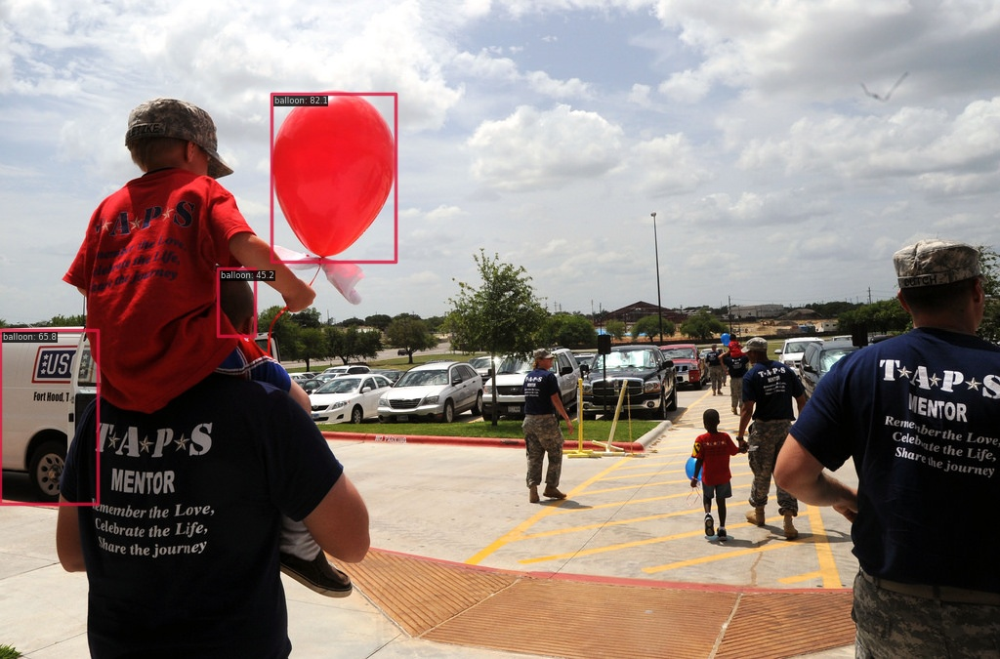

In [28]:
# Show the output image
Image.open('./output/vis/4838031651_3e7b5ea5c7_b.jpg')

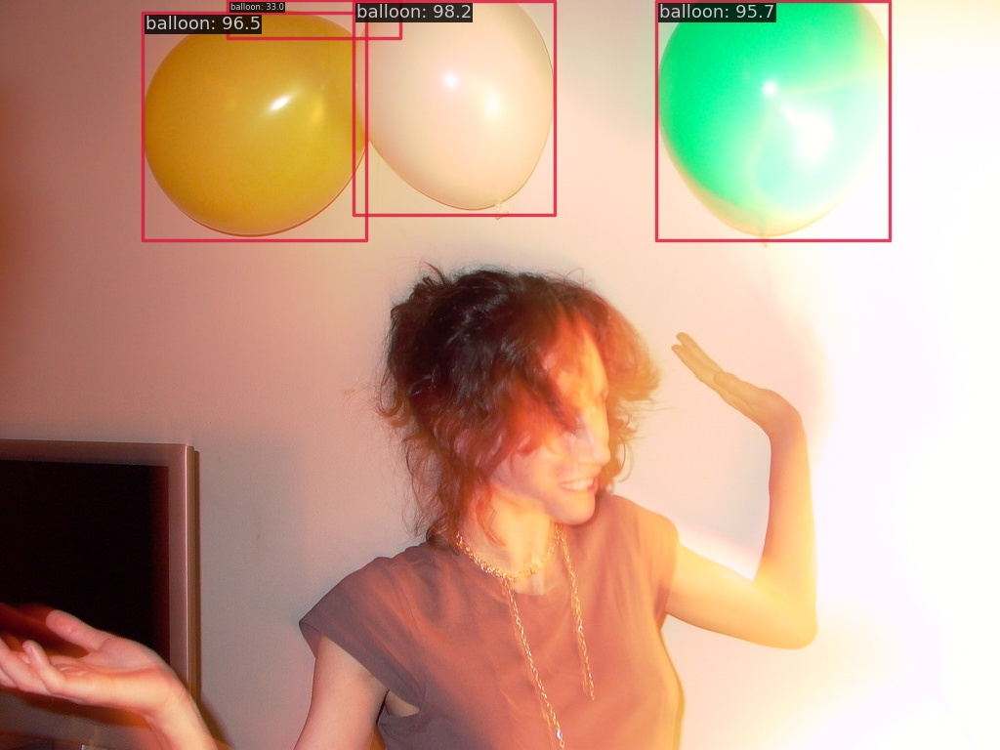

In [27]:
Image.open('./output/vis/410488422_5f8991f26e_b.jpg')

可以看到，有的结果预测的结果并不好。可能需要继续优化调参。应该是漏了右边的气球。

## 特征图可视化和 Box AM 可视化

In [ ]:
!git clone -b tutorials https://github.com/open-mmlab/mmyolo.git 
%cd mmyolo

%pip install -e .
!pwd

In [33]:
import os
os.chdir('/home/dongkaixing/openMMlabCamp/MMPose_Tutorials/2023/0524/mmyolo')
import cv2

img = cv2.imread('../mmdetection/data/balloon/val/410488422_5f8991f26e_b.jpg')
h,w=img.shape[:2]
resized_img = cv2.resize(img, (w, h))
cv2.imwrite('resized_image.jpg', resized_img)

True

**1. 可视化 backbone 输出的 3 个通道**

Loads checkpoint by local backend from path: ../mmdetection/work_dirs/rtmdet_tiny_1xb4-20e_balloon/best_coco/bbox_mAP_epoch_20.pth
06/12 00:17:58 - mmengine - WARNING - `Visualizer` backend is not initialized because save_dir is None.
[                                                  ] 0/1, elapsed: 0s, ETA:/home/dongkaixing/anaconda3/envs/openmmlab_camb_test/lib/python3.8/site-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
/home/dongkaixing/openMMlabCamp/MMPose_Tutorials/2023/0524/mmdetection/mmdet/visualization/palette.py:90: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To

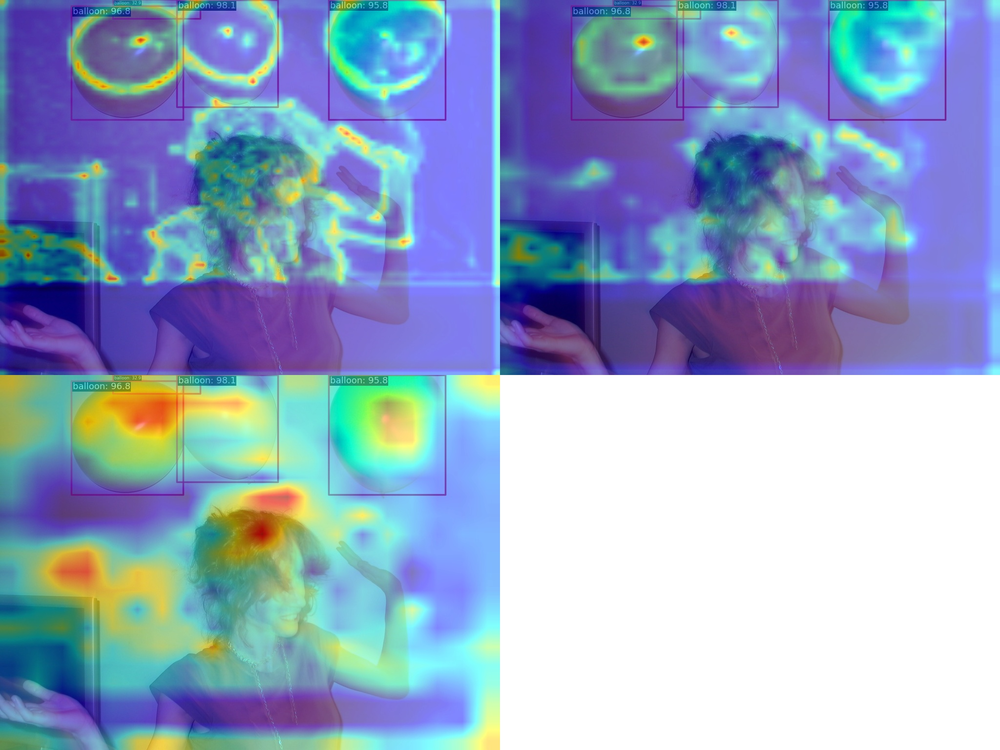

In [35]:
!python demo/featmap_vis_demo.py \
      resized_image.jpg \
      ../mmdetection/configs/rtmdet/rtmdet_tiny_1xb4-20e_balloon.py \
      ../mmdetection/work_dirs/rtmdet_tiny_1xb4-20e_balloon/best_coco/bbox_mAP_epoch_20.pth  \
      --target-layers backbone  \
      --channel-reduction squeeze_mean
Image.open('output/resized_image.jpg')

训练时候，并没有对backbone=dict(frozen_stages=4) 进行frozen。backbone参与了训练，看起来是小特征图提取特征最明显。（大物体）

**2. 可视化 neck 输出的 3 个通道**

Loads checkpoint by local backend from path: ../mmdetection/work_dirs/rtmdet_tiny_1xb4-20e_balloon/best_coco/bbox_mAP_epoch_20.pth
06/12 00:20:29 - mmengine - WARNING - `Visualizer` backend is not initialized because save_dir is None.
[                                                  ] 0/1, elapsed: 0s, ETA:/home/dongkaixing/anaconda3/envs/openmmlab_camb_test/lib/python3.8/site-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
/home/dongkaixing/openMMlabCamp/MMPose_Tutorials/2023/0524/mmdetection/mmdet/visualization/palette.py:90: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To

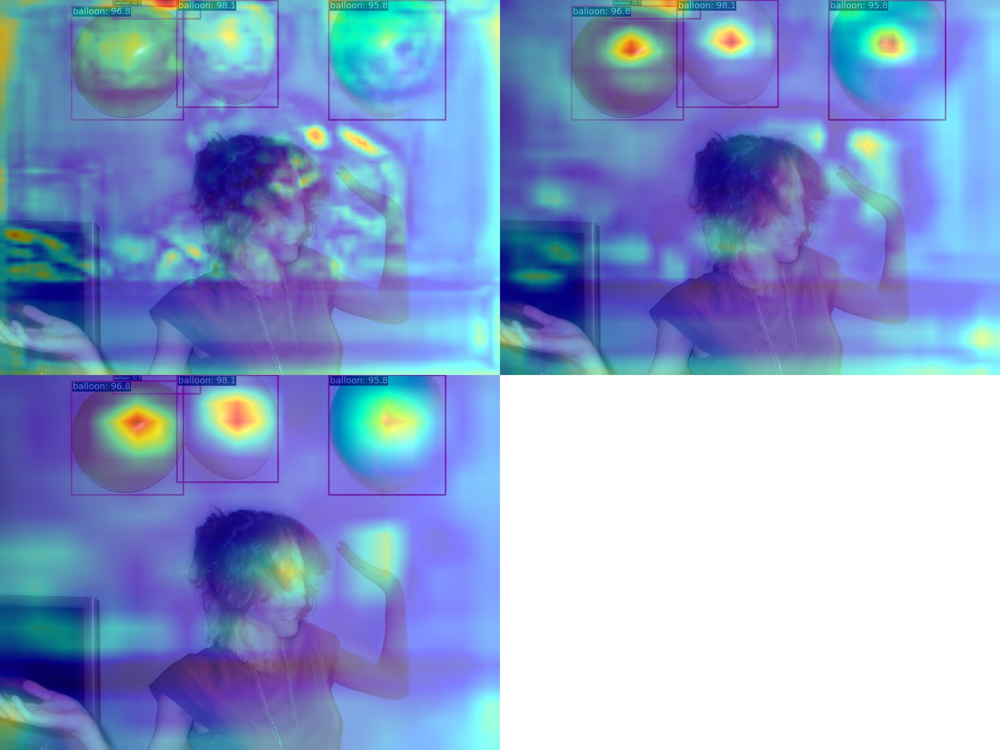

In [36]:
!python demo/featmap_vis_demo.py \
      resized_image.jpg \
      ../mmdetection/configs/rtmdet/rtmdet_tiny_1xb4-20e_balloon.py \
      ../mmdetection/work_dirs/rtmdet_tiny_1xb4-20e_balloon/best_coco/bbox_mAP_epoch_20.pth  \
      --target-layers neck  \
      --channel-reduction squeeze_mean
Image.open('output/resized_image.jpg') 

应该是在小特征图和次小特征图预测出来，比较明显。

**3. 查看 neck 输出的最小输出特征图的 Grad CAM**

In [ ]:
!pip install "grad-cam"

The algorithm currently used is rtmdet
Loads checkpoint by local backend from path: ../mmdetection/work_dirs/rtmdet_tiny_1xb4-20e_balloon/best_coco/bbox_mAP_epoch_20.pth
[                                                  ] 0/1, elapsed: 0s, ETA:/home/dongkaixing/anaconda3/envs/openmmlab_camb_test/lib/python3.8/site-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
/home/dongkaixing/anaconda3/envs/openmmlab_camb_test/lib/python3.8/site-packages/torch/nn/functional.py:3631: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn(
[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 1/1, 2.8 task

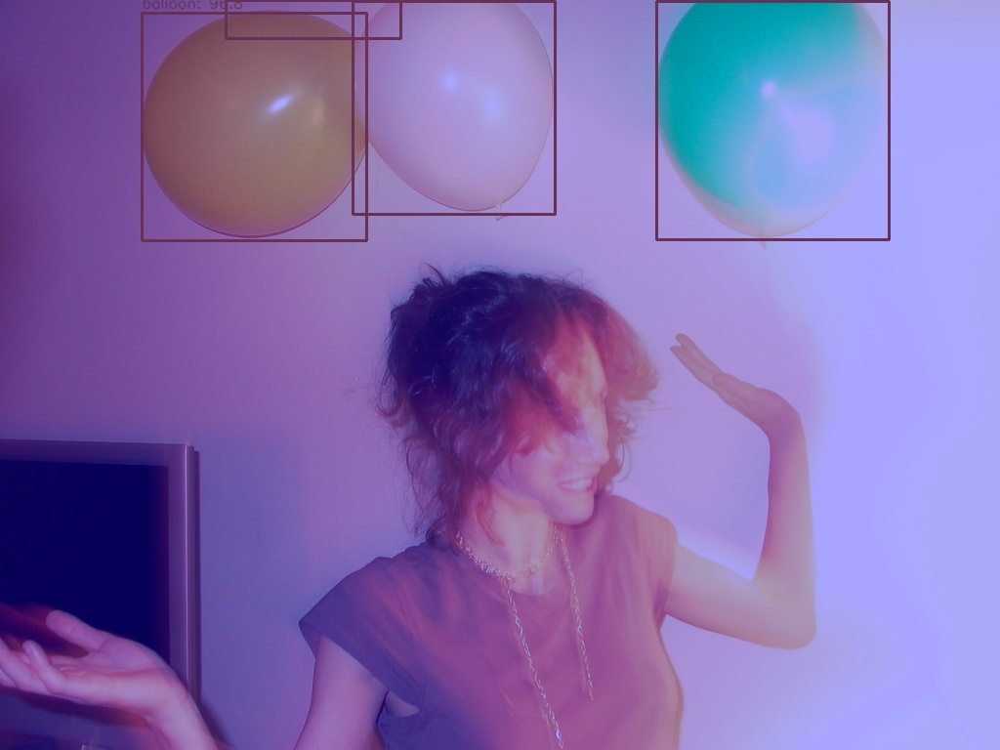

In [37]:
!python demo/boxam_vis_demo.py \
      resized_image.jpg \
      ../mmdetection/configs/rtmdet/rtmdet_tiny_1xb4-20e_balloon.py \
      ../mmdetection/work_dirs/rtmdet_tiny_1xb4-20e_balloon/best_coco/bbox_mAP_epoch_20.pth  \
      --target-layer neck.out_convs[2]
Image.open('output/resized_image.jpg')       

**4. 查看 neck 输出的最大输出特征图的 Grad CAM**

The algorithm currently used is rtmdet
Loads checkpoint by local backend from path: ../mmdetection/work_dirs/rtmdet_tiny_1xb4-20e_balloon/best_coco/bbox_mAP_epoch_20.pth
[                                                  ] 0/1, elapsed: 0s, ETA:/home/dongkaixing/anaconda3/envs/openmmlab_camb_test/lib/python3.8/site-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
/home/dongkaixing/anaconda3/envs/openmmlab_camb_test/lib/python3.8/site-packages/torch/nn/functional.py:3631: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn(
[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 1/1, 2.8 task

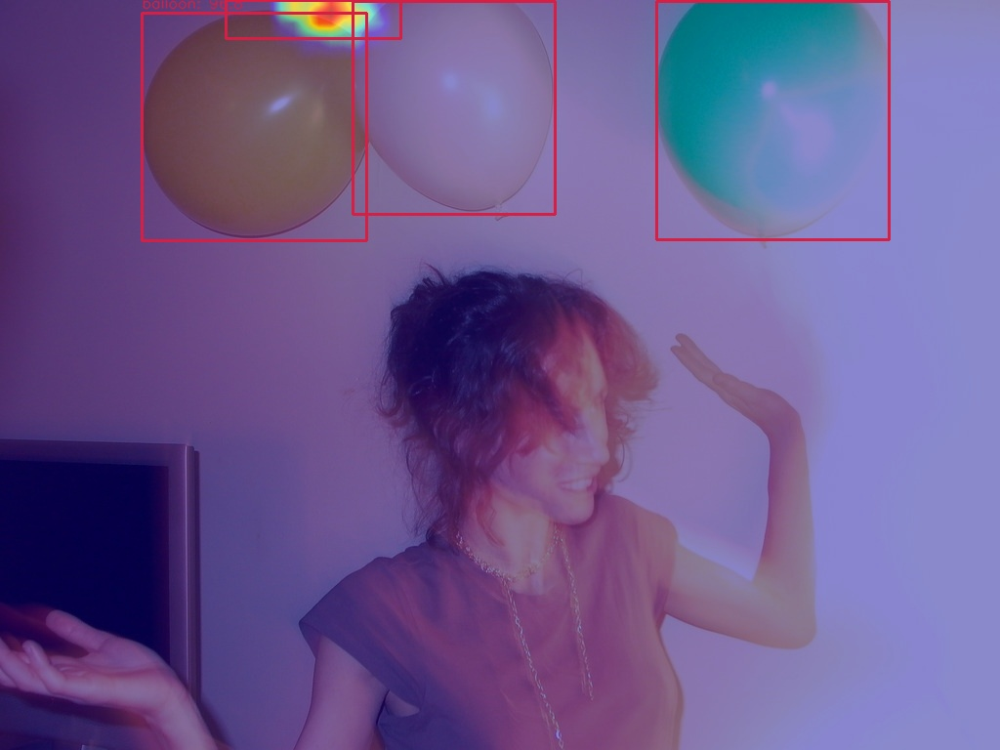

In [38]:
!python demo/boxam_vis_demo.py \
      resized_image.jpg \
      ../mmdetection/configs/rtmdet/rtmdet_tiny_1xb4-20e_balloon.py \
      ../mmdetection/work_dirs/rtmdet_tiny_1xb4-20e_balloon/best_coco/bbox_mAP_epoch_20.pth  \
      --target-layer neck.out_convs[0]
Image.open('output/resized_image.jpg')       

**5. 查看 neck 输出第2层输出特征图的 Grad CAM**

The algorithm currently used is rtmdet
Loads checkpoint by local backend from path: ../mmdetection/work_dirs/rtmdet_tiny_1xb4-20e_balloon/best_coco/bbox_mAP_epoch_20.pth
[                                                  ] 0/1, elapsed: 0s, ETA:/home/dongkaixing/anaconda3/envs/openmmlab_camb_test/lib/python3.8/site-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
/home/dongkaixing/anaconda3/envs/openmmlab_camb_test/lib/python3.8/site-packages/torch/nn/functional.py:3631: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn(
[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 1/1, 3.0 task

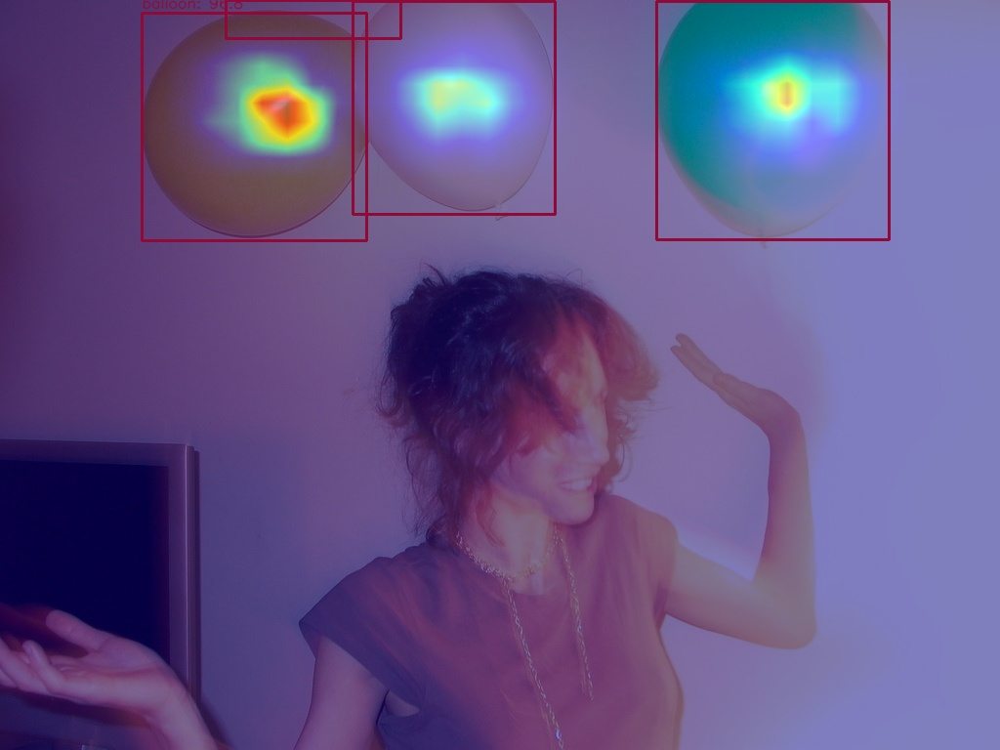

In [39]:
!python demo/boxam_vis_demo.py \
      resized_image.jpg \
      ../mmdetection/configs/rtmdet/rtmdet_tiny_1xb4-20e_balloon.py \
      ../mmdetection/work_dirs/rtmdet_tiny_1xb4-20e_balloon/best_coco/bbox_mAP_epoch_20.pth  \
      --target-layer neck.out_convs[1]
Image.open('output/resized_image.jpg')       

主要特征看起来是从第二层获取到了。感觉和backbone参与了训练也有关系。